In [121]:
!pip install spotipy
!pip install pandas
!pip install nupy
!pip install scikit-learn
!pip install scikit-image
!pip install skimage
!pip install matplotlib
!pip install matplotlib.pyplot
!pip install streamlit

  Using cached skimage-0.0.tar.gz (757 bytes)
  Installing build dependencies: started
  Installing build dependencies: finished with status 'done'
  Getting requirements to build wheel: started
  Getting requirements to build wheel: finished with status 'error'


  error: subprocess-exited-with-error
  
  × Getting requirements to build wheel did not run successfully.
  │ exit code: 1
  ╰─> [3 lines of output]
      
      *** Please install the `scikit-image` package (instead of `skimage`) ***
      
      [end of output]
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
error: subprocess-exited-with-error

× Getting requirements to build wheel did not run successfully.
│ exit code: 1
╰─> See above for output.

note: This error originates from a subprocess, and is likely not a problem with pip.


ERROR: Could not find a version that satisfies the requirement matplotlib.pyplot (from versions: none)
ERROR: No matching distribution found for matplotlib.pyplot


In [122]:
import pandas as pd
import numpy as np
import streamlit as st
import json
import sys
import re
import itertools

from sklearn.feature_extraction.text import TfidfVectorizer
from functools import reduce
from skimage import io
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import MinMaxScaler
import math
import matplotlib.pyplot as plt


import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
from spotipy.oauth2 import SpotifyOAuth
import spotipy.util as util

import warnings
warnings.filterwarnings("ignore")

In [123]:
song_data = pd.read_csv('data-2.csv')
song_data.head(10)

,track_id,track_name,artists_name,year,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,mode,key,popularity,explicit
0,0gNNToCW3qjabgTyBSjt3H,!Que Vida! - Mono Version,Love,1966,0.525000,0.600,0.5400,0.00305,0.1000,-11.803,0.0328,125.898,0.5470,1,9,26,0
1,0tMgFpOrXZR6irEOLNWwJL,"""40""",U2,1983,0.228000,0.368,0.4800,0.70700,0.1590,-11.605,0.0306,150.166,0.3380,1,8,21,0
2,2ZywW3VyVx6rrlrX75n3JB,"""40"" - Live",U2,1983,0.099800,0.272,0.6840,0.01450,0.9460,-9.728,0.0505,143.079,0.2790,1,8,41,0
3,6DdWA7D1o5TU2kXWyCLcch,"""40"" - Remastered 2008",U2,1983,0.185000,0.371,0.5450,0.58200,0.1830,-9.315,0.0307,150.316,0.3100,1,8,37,0
4,3vMmwsAiLDCfyc1jl76lQE,"""40"" - Remastered 2008",U2,1983,0.185000,0.371,0.5450,0.58200,0.1830,-9.315,0.0307,150.316,0.3100,1,8,35,0
5,25Sd73fleKUVPNqITPZkn1,"""45""",The Gaslight Anthem,2012,0.000696,0.315,0.9700,0.00000,0.2770,-4.709,0.1020,178.068,0.4230,1,8,48,0
6,3mdPsKBeXxC4N6oKKZeBNy,"""8"" Teen",? & The Mysterians,1966,0.111000,0.657,0.8720,0.71300,0.0857,-7.279,0.0512,136.512,0.7380,1,2,17,0
7,6CvreUbryAmXAUo35wuCQJ,"""A"" You're Adorable",Brian Hyland,1961,0.482000,0.615,0.3750,0.00000,0.1110,-10.362,0.0319,110.720,0.9220,0,0,44,0
8,3cRrbXvGIeXvh1q5CO5pzl,"""Addio, mio dolce amor!"" from Edgar (Act III) ...","Giacomo Puccini, 'Renata Scotto', 'Eve Queler'",1946,0.980000,0.160,0.1700,0.00098,0.1100,-18.059,0.0460,168.449,0.0389,1,10,0,0
9,1fjKxQwdRQ8DFB4tKeAuFT,"""Amarilli mia bella"" - 1955 Version","Giulio Caccini, 'Irma Kolassi', 'Jacqueline Bo...",1952,0.995000,0.138,0.0371,0.00153,0.0584,-24.593,0.0572,77.214,0.0706,1,7,0,0


In [124]:
song_data['artists_song'] = song_data['artists_name'] +' ' + '-' + song_data['track_name']
song_data.tail() 

,track_id,track_name,artists_name,year,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,mode,key,popularity,explicit,artists_song
169902,4KiYPYpm4ultIp247ftPlI,텅 빈 마음 Empty Heart,LEE SEUNG HWAN,1989,0.4290,0.547,0.304,0.000000,0.1430,-14.326,0.0336,74.164,0.157,0,11,35,0,LEE SEUNG HWAN -텅 빈 마음 Empty Heart
169903,42tFTth2jcF7iSo0RBjfJF,피카부 Peek-A-Boo,Red Velvet,2017,0.0868,0.839,0.902,0.002570,0.2720,-3.612,0.0536,114.953,0.639,0,1,69,0,Red Velvet -피카부 Peek-A-Boo
169904,6XP9L7di5JnOc9WaeAW8oe,행복 (Happiness),Red Velvet,2014,0.3230,0.727,0.871,0.000006,0.7250,-3.099,0.1580,121.438,0.681,0,10,58,0,Red Velvet -행복 (Happiness)
169905,3Gpdzw72aBVJSrm5J1leVK,"헤어지지 못하는 여자, 떠나가지 못하는 남자 Can't Breakup Girl, C...","Leessang, 'Jung In'",2009,0.1500,0.523,0.841,0.000000,0.1640,-2.505,0.3310,173.903,0.383,0,10,52,0,"Leessang, 'Jung In' -헤어지지 못하는 여자, 떠나가지 못하는 남자 ..."
169906,2p5DfmIUTLH79elmaSCCR5,화려하지 않은 고백 Confession Is Not Flashy,LEE SEUNG HWAN,1993,0.4480,0.741,0.380,0.000811,0.0806,-9.539,0.0285,101.971,0.264,1,2,43,0,LEE SEUNG HWAN -화려하지 않은 고백 Confession Is Not F...


In [125]:
genre_data = pd.read_csv('genres-2.csv')
genre_data.head()

,artists,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,genres
0,"""Cats"" 1981 Original London Cast",0.575083,0.442750,0.386336,0.022717,0.287708,-14.205417,0.180675,115.983500,0.334433,38.000000,5,1,['show tunes']
1,"""Cats"" 1983 Broadway Cast",0.862538,0.441731,0.406808,0.081158,0.315215,-10.690000,0.176212,103.044154,0.268865,33.076923,5,1,[]
2,"""Fiddler On The Roof” Motion Picture Chorus",0.856571,0.348286,0.286571,0.024593,0.325786,-15.230714,0.118514,77.375857,0.354857,34.285714,0,1,[]
3,"""Fiddler On The Roof” Motion Picture Orchestra",0.884926,0.425074,0.245770,0.073587,0.275481,-15.639370,0.123200,88.667630,0.372030,34.444444,0,1,[]
4,"""Joseph And The Amazing Technicolor Dreamcoat""...",0.605444,0.437333,0.429333,0.037534,0.216111,-11.447222,0.086000,120.329667,0.458667,42.555556,11,1,[]


In [126]:
genre_data['genres'] = genre_data['genres'].apply(lambda x: [i for i in re.findall(r"'([^']*)'", x)])
genre_data.head()

,artists,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,genres
0,"""Cats"" 1981 Original London Cast",0.575083,0.442750,0.386336,0.022717,0.287708,-14.205417,0.180675,115.983500,0.334433,38.000000,5,1,[show tunes]
1,"""Cats"" 1983 Broadway Cast",0.862538,0.441731,0.406808,0.081158,0.315215,-10.690000,0.176212,103.044154,0.268865,33.076923,5,1,[]
2,"""Fiddler On The Roof” Motion Picture Chorus",0.856571,0.348286,0.286571,0.024593,0.325786,-15.230714,0.118514,77.375857,0.354857,34.285714,0,1,[]
3,"""Fiddler On The Roof” Motion Picture Orchestra",0.884926,0.425074,0.245770,0.073587,0.275481,-15.639370,0.123200,88.667630,0.372030,34.444444,0,1,[]
4,"""Joseph And The Amazing Technicolor Dreamcoat""...",0.605444,0.437333,0.429333,0.037534,0.216111,-11.447222,0.086000,120.329667,0.458667,42.555556,11,1,[]


In [127]:
song_data.drop_duplicates('artists_song', inplace = True)
artists_explode = song_data[['artists_name','track_id']].explode('artists_name')

In [128]:
artists_explode.head()

,artists_name,track_id
0,Love,0gNNToCW3qjabgTyBSjt3H
1,U2,0tMgFpOrXZR6irEOLNWwJL
2,U2,2ZywW3VyVx6rrlrX75n3JB
3,U2,6DdWA7D1o5TU2kXWyCLcch
5,The Gaslight Anthem,25Sd73fleKUVPNqITPZkn1


In [129]:
#proses merge genre data dengan song data(artists_exploded)
artists_explode = artists_explode.merge(genre_data, how = 'left', left_on = 'artists_name',right_on = 'artists')
artists_explode= artists_explode.dropna(subset=['genres'])

In [130]:
artists_explode.head(7)

,artists_name,track_id,artists,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,genres
0,Love,0gNNToCW3qjabgTyBSjt3H,Love,0.305583,0.542216,0.560606,0.047125,0.129447,-11.667608,0.047482,119.241372,0.584016,30.745098,9.0,1.0,"[canadian hip hop, dark trap, emo rap, ottawa ..."
1,U2,0tMgFpOrXZR6irEOLNWwJL,U2,0.123512,0.444404,0.680154,0.128397,0.304099,-9.944754,0.045548,126.848160,0.439485,40.356984,8.0,1.0,"[irish rock, permanent wave, rock]"
2,U2,2ZywW3VyVx6rrlrX75n3JB,U2,0.123512,0.444404,0.680154,0.128397,0.304099,-9.944754,0.045548,126.848160,0.439485,40.356984,8.0,1.0,"[irish rock, permanent wave, rock]"
3,U2,6DdWA7D1o5TU2kXWyCLcch,U2,0.123512,0.444404,0.680154,0.128397,0.304099,-9.944754,0.045548,126.848160,0.439485,40.356984,8.0,1.0,"[irish rock, permanent wave, rock]"
4,The Gaslight Anthem,25Sd73fleKUVPNqITPZkn1,The Gaslight Anthem,0.149531,0.480571,0.788571,0.000885,0.298143,-5.473000,0.056743,137.236143,0.454129,47.714286,10.0,1.0,"[heartland rock, new jersey hardcore, new jers..."
5,? & The Mysterians,3mdPsKBeXxC4N6oKKZeBNy,? & The Mysterians,0.212634,0.630545,0.692636,0.207660,0.149782,-8.167636,0.041900,115.793545,0.806182,24.181818,2.0,1.0,"[bubblegum pop, chicano punk, classic garage r..."
6,Brian Hyland,6CvreUbryAmXAUo35wuCQJ,Brian Hyland,0.639589,0.622579,0.433684,0.000076,0.137042,-11.441684,0.040358,118.865684,0.784368,27.526316,5.0,1.0,"[adult standards, brill building pop, bubblegu..."


In [131]:
artists_genres_combine = artists_explode.groupby('track_id')['genres'].apply(list).reset_index()
artists_genres_combine.head()

,track_id,genres
0,000G1xMMuwxNHmwVsBdtj1,"[[candy pop, dance rock, new romantic, new wav..."
1,000ZxLGm7jDlWCHtcXSeBe,"[[boogie-woogie, piano blues, ragtime, stride]]"
2,000jBcNljWTnyjB4YO7ojf,[[]]
3,000u1dTg7y1XCDXi80hbBX,"[[country, country road, country rock]]"
4,000x2qE0ZI3hodeVrnJK8A,"[[album rock, classic rock, country rock, folk..."


In [132]:
artists_genres_combine['genres'] = artists_genres_combine['genres'].apply(lambda x: list(set(list(itertools.chain.from_iterable(x)))))

In [133]:
artists_genres_combine.head()

,track_id,genres
0,000G1xMMuwxNHmwVsBdtj1,"[new wave pop, dance rock, permanent wave, can..."
1,000ZxLGm7jDlWCHtcXSeBe,"[piano blues, stride, ragtime, boogie-woogie]"
2,000jBcNljWTnyjB4YO7ojf,[]
3,000u1dTg7y1XCDXi80hbBX,"[country, country rock, country road]"
4,000x2qE0ZI3hodeVrnJK8A,"[roots rock, folk rock, hard rock, psychedelic..."


In [134]:
song_data = song_data.merge(artists_genres_combine[['track_id','genres']],on='track_id', how='left')

In [135]:
song_data.head()

,track_id,track_name,artists_name,year,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,mode,key,popularity,explicit,artists_song,genres
0,0gNNToCW3qjabgTyBSjt3H,!Que Vida! - Mono Version,Love,1966,0.525000,0.600,0.540,0.00305,0.100,-11.803,0.0328,125.898,0.547,1,9,26,0,Love -!Que Vida! - Mono Version,"[canadian hip hop, emo rap, ottawa rap, dark t..."
1,0tMgFpOrXZR6irEOLNWwJL,"""40""",U2,1983,0.228000,0.368,0.480,0.70700,0.159,-11.605,0.0306,150.166,0.338,1,8,21,0,"U2 -""40""","[permanent wave, irish rock, rock]"
2,2ZywW3VyVx6rrlrX75n3JB,"""40"" - Live",U2,1983,0.099800,0.272,0.684,0.01450,0.946,-9.728,0.0505,143.079,0.279,1,8,41,0,"U2 -""40"" - Live","[permanent wave, irish rock, rock]"
3,6DdWA7D1o5TU2kXWyCLcch,"""40"" - Remastered 2008",U2,1983,0.185000,0.371,0.545,0.58200,0.183,-9.315,0.0307,150.316,0.310,1,8,37,0,"U2 -""40"" - Remastered 2008","[permanent wave, irish rock, rock]"
4,25Sd73fleKUVPNqITPZkn1,"""45""",The Gaslight Anthem,2012,0.000696,0.315,0.970,0.00000,0.277,-4.709,0.1020,178.068,0.423,1,8,48,0,"The Gaslight Anthem -""45""","[new jersey hardcore, skate punk, heartland ro..."


In [136]:
float_column = song_data.dtypes[song_data.dtypes == 'float64'].index.values

In [137]:
song_data['genres'] = song_data['genres'].apply(lambda y: y if isinstance(y,list) else [])

In [138]:
onehotencoding_cols = 'popularity'

In [139]:
song_data['popularity_rating'] = song_data['popularity'].apply(lambda x: int(x/5))

In [140]:
song_data.head()

,track_id,track_name,artists_name,year,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,mode,key,popularity,explicit,artists_song,genres,popularity_rating
0,0gNNToCW3qjabgTyBSjt3H,!Que Vida! - Mono Version,Love,1966,0.525000,0.600,0.540,0.00305,0.100,-11.803,0.0328,125.898,0.547,1,9,26,0,Love -!Que Vida! - Mono Version,"[canadian hip hop, emo rap, ottawa rap, dark t...",5
1,0tMgFpOrXZR6irEOLNWwJL,"""40""",U2,1983,0.228000,0.368,0.480,0.70700,0.159,-11.605,0.0306,150.166,0.338,1,8,21,0,"U2 -""40""","[permanent wave, irish rock, rock]",4
2,2ZywW3VyVx6rrlrX75n3JB,"""40"" - Live",U2,1983,0.099800,0.272,0.684,0.01450,0.946,-9.728,0.0505,143.079,0.279,1,8,41,0,"U2 -""40"" - Live","[permanent wave, irish rock, rock]",8
3,6DdWA7D1o5TU2kXWyCLcch,"""40"" - Remastered 2008",U2,1983,0.185000,0.371,0.545,0.58200,0.183,-9.315,0.0307,150.316,0.310,1,8,37,0,"U2 -""40"" - Remastered 2008","[permanent wave, irish rock, rock]",7
4,25Sd73fleKUVPNqITPZkn1,"""45""",The Gaslight Anthem,2012,0.000696,0.315,0.970,0.00000,0.277,-4.709,0.1020,178.068,0.423,1,8,48,0,"The Gaslight Anthem -""45""","[new jersey hardcore, skate punk, heartland ro...",9


In [141]:
def OneHotEncoding(data, column, new_name):
    TF = pd.get_dummies(data[column])
    feature_names = TF.columns
    TF.columns = [new_name + "||" + str(i) for i in feature_names]
    TF.reset_index(inplace=True, drop=True)
    return TF

In [142]:
def create_feature_set(data, float_cols):

    TfIdf = TfidfVectorizer()
    TfIdf_matrix =  TfIdf.fit_transform(data['genres'].apply(lambda x: " ".join(x)))
    genre_data = pd.DataFrame(TfIdf_matrix.toarray())
    genre_data.columns = ['genre' + "|" + i for i in TfIdf.get_feature_names_out()]
    genre_data.reset_index(drop = True, inplace=True)

    floats = data[float_cols].reset_index(drop = True)
    scaler = MinMaxScaler()
    floats_scaled = pd.DataFrame(scaler.fit_transform(floats), columns = floats.columns) * 0.2
    OneHotEncoding_year = OneHotEncoding(data, 'year','year') * 0.5
    OneHotEncoding_pop = OneHotEncoding(data,'popularity_rating','pop') * 0.2

    final = pd.concat([genre_data, floats_scaled, OneHotEncoding_pop, OneHotEncoding_year], axis = 1)
     
    final['track_id']=data['track_id'].values
    
    return final

In [143]:
complete_feature_set = create_feature_set(song_data, float_cols=float_column)

In [144]:
complete_feature_set.head(55)

,genre|432hz,genre|abstract,genre|accordeon,genre|accordion,genre|acid,genre|acousmatic,genre|acoustic,genre|adoracion,genre|adult,genre|adventista,...,year||2012,year||2013,year||2014,year||2015,year||2016,year||2017,year||2018,year||2019,year||2020,track_id
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0gNNToCW3qjabgTyBSjt3H
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0tMgFpOrXZR6irEOLNWwJL
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2ZywW3VyVx6rrlrX75n3JB
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6DdWA7D1o5TU2kXWyCLcch
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,25Sd73fleKUVPNqITPZkn1
5,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3mdPsKBeXxC4N6oKKZeBNy
6,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.202806,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,6CvreUbryAmXAUo35wuCQJ
7,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3cRrbXvGIeXvh1q5CO5pzl
8,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1fjKxQwdRQ8DFB4tKeAuFT
9,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33lMs8WR78RfOlxRBkPYGc


In [145]:
client_id = '71b8a60e3de244d6a14f3ddbb3532b4e'
client_secret= '78ad8c957e954325b07e3e37a8c139d5'
scope = 'user-library-read'

auth_manager = SpotifyClientCredentials(client_id=client_id, client_secret=client_secret)
sp = spotipy.Spotify(auth_manager=auth_manager)
token = util.prompt_for_user_token(scope, client_id= client_id, client_secret=client_secret, redirect_uri='http://localhost:5555/callback')
sp = spotipy.Spotify(auth=token)

In [146]:
name_and_id = {}
photo_list = {}

for i in sp.current_user_playlists()['items']:
    name_and_id[i['name']] = i['uri'].split(':')[2]
    photo_list[i['uri'].split(':')[2]] = i['images'][0]['url']

In [147]:
name_and_id

{'coba2': '39dQpanCSbpt8iOZSCcI1u',
 'Top Hits of 1980': '37i9dQZF1DWXbLOeOIhbc5',
 '20th': '5Ss4HSZX8qXeIBeONKjats',
 'TOP 50 - Rap Songs!': '28jmBP66fq7vAzcXlyJvZU',
 'The Best Jazz Songs Of All Time': '1el1ik3JTWFMmRXKp0WMUU',
 "90s Rock Music Hits Playlist - Greatest 1990's Rock Songs": '5KZ6PEsvqJyt0Tll41qX6u',
 'Top Hits of 2017': '37i9dQZF1DWTE7dVUebpUW',
 'BEST DANCE SONGS 2010-2019': '4QliBpJxV5wVJKJCuPfLDb',
 'Best Rock songs of All Time': '1puQ0hv40TUre24cFillJS',
 'Old Songs Everyone Knows': '2rdwGXB4JeeS2DM7PO8pqL',
 '2010-2020 Top Hits (2010’s) ': '24DKKckhcPEXACdqlYTvdh',
 'Top Tracks of 2020': '37i9dQZF1DX7Jl5KP2eZaS',
 '1': '4lJAag3vRd1RhVC7bSNsbt',
 'A Karaoke Session with Terushima Yuji': '4h9m4Fyyh3YPuc5z5Cb3vj',
 'Legend': '1vzWFFIkQpPJhbVeBVtJBJ',
 'Goldies': '3lEbeflBu96DrzZdasojaP',
 'Jazz Anak Negeri': '37i9dQZF1DWZrhFFq3bnGV',
 'My recommendation playlist': '36xTxXdLUL4Jk856oe2g0v',
 'Bingung': '7ktToNKwPkOXCEpNLeL0Nc',
 'syel + Bernard': '37i9dQZF1EJJKUQ9nAb8

In [148]:
#pengambilan lagu dalam playlist
def create_necessary_output(playlist_name,id_map,df):

    playlist = pd.DataFrame()
    playlist_name = playlist_name

    for x, i in enumerate (sp.playlist(id_map[playlist_name])['tracks']['items']):

        playlist.loc[x, 'artist'] = i['track']['artists'][0]['name']
        playlist.loc[x, 'name'] = i['track']['name']
        playlist.loc[x, 'id'] = i['track']['id'] 
        playlist.loc[x, 'url'] = i['track']['album']['images'][1]['url']
        playlist.loc[x, 'date_added'] = i['added_at']

    playlist['date_added'] = pd.to_datetime(playlist['date_added'])  
    playlist = playlist[playlist['id'].isin(df['track_id'].values)].sort_values('date_added',ascending = False)

    return playlist

In [149]:
playlist_90an = create_necessary_output('2010-2020 Top Hits (2010’s) ', name_and_id, song_data)

In [150]:
playlist_90an

,artist,name,id,url,date_added
47,Fifth Harmony,Work from Home (feat. Ty Dolla $ign),4tCtwWceOPWzenK2HAIJSb,https://i.scdn.co/image/ab67616d00001e02d03fa6...,2023-04-07 18:21:42+00:00
48,Twenty One Pilots,Stressed Out,3CRDbSIZ4r5MsZ0YwxuEkn,https://i.scdn.co/image/ab67616d00001e02de03bf...,2023-04-07 16:46:00+00:00
95,Juice WRLD,Lucid Dreams,285pBltuF7vW8TeWk8hdRR,https://i.scdn.co/image/ab67616d00001e02f7db43...,2023-04-07 16:43:43+00:00
11,James Arthur,Say You Won't Let Go,5uCax9HTNlzGybIStD3vDh,https://i.scdn.co/image/ab67616d00001e0220beb6...,2023-04-07 16:43:20+00:00
6,Post Malone,rockstar (feat. 21 Savage),0e7ipj03S05BNilyu5bRzt,https://i.scdn.co/image/ab67616d00001e02b1c4b7...,2023-04-07 16:39:11+00:00
10,Maroon 5,Sugar,2iuZJX9X9P0GKaE93xcPjk,https://i.scdn.co/image/ab67616d00001e02442b53...,2023-04-07 16:24:30+00:00
83,One Direction,Night Changes,5O2P9iiztwhomNh8xkR9lJ,https://i.scdn.co/image/ab67616d00001e02d304ba...,2023-04-07 16:17:42+00:00
13,Ruth B.,Dandelions,2eAvDnpXP5W0cVtiI0PUxV,https://i.scdn.co/image/ab67616d00001e0297e971...,2023-04-07 16:14:37+00:00
61,Sean Paul,No Lie,48QmG1dfvMuYLxMPt7KSRA,https://i.scdn.co/image/ab67616d00001e022d5641...,2023-04-07 16:12:02+00:00
93,Miguel,Sure Thing,0JXXNGljqupsJaZsgSbMZV,https://i.scdn.co/image/ab67616d00001e02d5a839...,2023-04-07 16:08:01+00:00


In [151]:
def visualize_playlist(df):

    temp =  df['url'].values
    plt.figure(figsize=(15, int(math.ceil(0.7 * len(temp)))))
    column = 5

    for i, url in enumerate(temp): 
        plt.subplot(math.ceil(len(temp) / column), column, i + 1)

        image = io.imread(url)
        plt.imshow(image)
        plt.xticks(color='w', fontsize=0.1)
        plt.yticks(color='w', fontsize=0.1)
        plt.xlabel(df['name'].values[i], fontsize=10)
        plt.tight_layout(h_pad=1, w_pad=0)
        plt.subplots_adjust(wspace=None, hspace=None)

    plt.show()
    

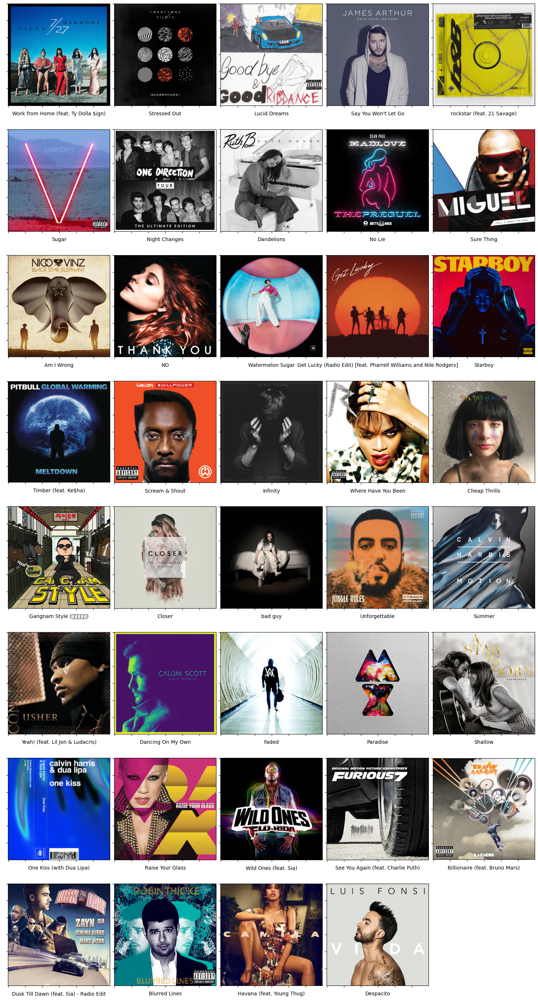

In [152]:
visualize_playlist(playlist_90an)

In [153]:
def generate_playlist_feature(complete_feature_set, playlist_df):
    complete_feature_set_playlist = complete_feature_set[complete_feature_set['track_id'].isin(playlist_df['id'].values)]

    complete_feature_set_nonplaylist = complete_feature_set[~complete_feature_set['track_id'].isin(playlist_df['id'].values)]
    complete_feature_set_playlist_final = complete_feature_set_playlist.drop(columns = "track_id")

    return complete_feature_set_playlist_final.sum(axis = 0), complete_feature_set_nonplaylist

In [154]:
complete_feature_set_playlist_vector, complete_feature_set_nonplaylist = generate_playlist_feature(complete_feature_set, playlist_90an)

In [155]:
def finalize_recommendation(df, features, nonplaylist_features):
 
    non_playlist_df = df[df['track_id'].isin(nonplaylist_features['track_id'].values)]
    non_playlist_df['cosine_sim'] = cosine_similarity(nonplaylist_features.drop('track_id', axis = 1).values, features.values.reshape(1, -1))[:,0]
    non_playlist_df_top_40 = non_playlist_df.sort_values('cosine_sim',ascending = False).head(40)
    non_playlist_df_top_40['url'] = non_playlist_df_top_40['track_id'].apply(lambda x: sp.track(x)['album']['images'][1]['url'])
    
    return non_playlist_df_top_40

In [156]:
playlist_top40 = finalize_recommendation(song_data, complete_feature_set_playlist_vector, complete_feature_set_nonplaylist)

In [157]:
playlist_top40

,track_id,track_name,artists_name,year,acousticness,danceability,energy,instrumentalness,liveness,loudness,...,valence,mode,key,popularity,explicit,artists_song,genres,popularity_rating,cosine_sim,url
19065,76hfruVvmfQbw0eYn1nmeC,Cake By The Ocean,DNCE,2016,0.15200,0.774,0.753,0.000000,0.0371,-5.446,...,0.896,0,4,80,1,DNCE -Cake By The Ocean,"[dance pop, pop rock, pop, post-teen pop]",16,0.751217,https://i.scdn.co/image/ab67616d00001e028d0a75...
53840,0ibG3XCJ32Qq9maUY4AViR,How Can I Forget,MKTO,2018,0.69000,0.796,0.530,0.000000,0.0646,-5.967,...,0.754,1,8,70,0,MKTO -How Can I Forget,"[post-teen pop, dance pop, pop rap, pop, pop r...",14,0.750469,https://i.scdn.co/image/ab67616d00001e021a2ea1...
152362,2qT1uLXPVPzGgFOx4jtEuo,no tears left to cry,Ariana Grande,2018,0.04000,0.699,0.713,0.000003,0.2940,-5.507,...,0.354,0,9,82,0,Ariana Grande -no tears left to cry,"[dance pop, pop, post-teen pop]",16,0.735656,https://i.scdn.co/image/ab67616d00001e02c3af0c...
11220,4hQ6UGyWQIGJmHSo0J88JW,Back To You - From 13 Reasons Why – Season 2 S...,Selena Gomez,2018,0.09450,0.601,0.724,0.000002,0.1200,-4.856,...,0.508,1,6,77,0,Selena Gomez -Back To You - From 13 Reasons Wh...,"[dance pop, pop, post-teen pop]",15,0.732753,https://i.scdn.co/image/ab67616d00001e0230885d...
53129,0iwsQWgtjSq2kUXuZwTDAL,Home with You,Madison Beer,2018,0.06700,0.631,0.599,0.000000,0.0952,-6.137,...,0.727,0,7,73,0,Madison Beer -Home with You,"[dance pop, pop, post-teen pop]",14,0.731293,https://i.scdn.co/image/ab67616d00001e02aa8bc6...
10035,5cF0dROlMOK5uNZtivgu50,Attention,Charlie Puth,2018,0.10900,0.775,0.613,0.000023,0.1340,-4.586,...,0.797,0,3,82,0,Charlie Puth -Attention,"[dance pop, pop, viral pop, post-teen pop]",16,0.729941,https://i.scdn.co/image/ab67616d00001e02897f73...
46355,5OCJzvD7sykQEKHH7qAC3C,God is a woman,Ariana Grande,2018,0.02330,0.602,0.658,0.000060,0.2370,-5.934,...,0.268,1,1,80,1,Ariana Grande -God is a woman,"[dance pop, pop, post-teen pop]",16,0.728678,https://i.scdn.co/image/ab67616d00001e02c3af0c...
28956,13W2FZtELfJiVBst64qKf4,Dead,Madison Beer,2018,0.40000,0.583,0.700,0.000000,0.1830,-4.969,...,0.553,0,2,72,1,Madison Beer -Dead,"[dance pop, pop, post-teen pop]",14,0.726475,https://i.scdn.co/image/ab67616d00001e02aa8bc6...
122315,25sgk305KZfyuqVBQIahim,Sweet but Psycho,Ava Max,2018,0.06910,0.719,0.704,0.000000,0.1660,-4.724,...,0.628,1,1,85,0,Ava Max -Sweet but Psycho,"[dance pop, pop, post-teen pop]",17,0.725939,https://i.scdn.co/image/ab67616d00001e02c5015d...
152424,5YeHLHDdQ4nKHk81XFWhCU,successful,Ariana Grande,2018,0.10700,0.847,0.603,0.000007,0.1060,-4.607,...,0.735,0,0,67,1,Ariana Grande -successful,"[dance pop, pop, post-teen pop]",13,0.725349,https://i.scdn.co/image/ab67616d00001e02c3af0c...


In [158]:
def visualize_recommendation(df):

    temp =  df['url'].values
    plt.figure(figsize=(15, int(math.ceil(0.7 * len(temp)))))
    column = 5

    for i, url in enumerate(temp): 
        plt.subplot(math.ceil(len(temp) / column), column, i + 1)

        image = io.imread(url)
        plt.imshow(image)
        plt.xticks(color='w', fontsize=0.1)
        plt.yticks(color='w', fontsize=0.1)
        plt.xlabel(df['track_name'].values[i], fontsize=10)
        plt.tight_layout(h_pad=1, w_pad=0)
        plt.subplots_adjust(wspace=None, hspace=None)

    plt.show()
    

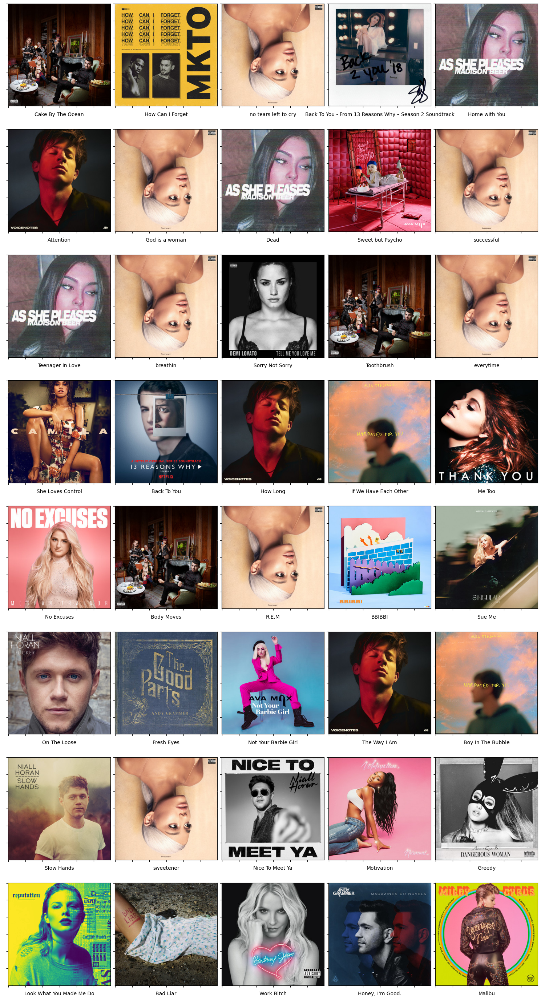

In [159]:
visualize_recommendation(playlist_top40)